In [3]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.sparse import coo_matrix

Read the data

In [2]:
prot_data_path = "/home/wuxinchao/data/st_cite_data/B01825A4_protein_filter.csv"
rna_data_path = "/home/wuxinchao/data/st_cite_data/B01825A4_rna_raw.csv"

gene_map = {
    "CD11c": "Itgax",
    "CD27" : "Cd27",
    "CD8a" : "Cd8a",
    "CD68" : "Cd68",
    "2" : "Thy1",
    "CD3" : "Cd3g",
    "CD44" : "Cd44",
    "CD5" : "Cd5",
    "CD4" : "Cd4",
    "CD29" : "Itgb1"
}

In [3]:
prot_data = pd.read_csv(prot_data_path)
rna_data = pd.read_csv(rna_data_path)

In [5]:
prot_data.columns = prot_data.columns.str.split("_").str[-1]
# rename the columns of the prot_data based on the gene_map
prot_data.rename(columns=gene_map, inplace=True)

# using the data in prot_data replace the columns in rna_data
rna_data.index = rna_data["Unnamed: 0"]
rna_data.drop("Unnamed: 0", axis=1, inplace=True)
prot_data.index = prot_data["Unnamed: 0"]
prot_data.drop("Unnamed: 0", axis=1, inplace=True)

# rna_coords
rna_coords = np.asarray(rna_data.index.str.split("_", expand=True))
rna_coordination = np.asarray([[int(coord[0]), int(coord[1])] for coord in rna_coords])

# prot_coords
prot_coords = np.asarray(prot_data.index.str.split("_", expand=True))
prot_coordination = np.asarray([[int(coord[0]), int(coord[1])] for coord in prot_coords])

Replace the corresponding rna expression with protein expression

In [17]:
def align_prot_rna_mtx(df, gene_name):
    data = df[gene_name]
    coords = np.asarray(data.index.str.split("_", expand=True))
    coordination = np.asarray([[int(coord[0]), int(coord[1])] for coord in coords])
    # delete the data with coordination[1] less than 13
    x_mask_ind = coordination[:, 0] >= 13
    y_mask_ind = coordination[:, 1] <= 78
    mask_ind = x_mask_ind & y_mask_ind
    data = data[mask_ind]
    coordination = coordination[mask_ind]
    row_ind = coordination[:, 0] - 13
    col_ind = coordination[:, 1]
    data = data.values
    coo = coo_matrix((data, (row_ind, col_ind)), shape=np.max(coordination, axis=0)+1)
    csr = coo.tocsr()
    plt.scatter(row_ind, col_ind, c=data, cmap="inferno", s=2)
    plt.title(f"{gene_name} spatial expression")
    plt.colorbar()
    plt.show()
    return csr

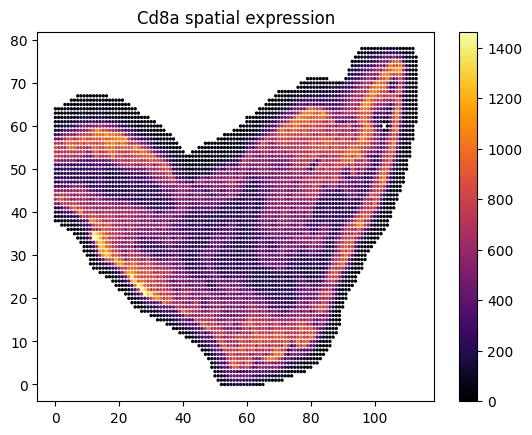

In [18]:
csr_mtx = align_prot_rna_mtx(prot_data, "Cd8a")

In [96]:
# convert the csr_mtx to a df with only one column named "Cd8a", and the index is the coordination "x_y"
def csr2df(csr_mtx, gene_name):
    # make sure the csr_mtx has no zero value
    csr_mtx.eliminate_zeros()
    data = csr_mtx.data
    # get the coordination of the data
    ind_list = csr_mtx.nonzero()[0].tolist()
    col_list = csr_mtx.nonzero()[1].tolist()
    coord_list = [f"{ind}_{col}" for ind, col in zip(ind_list, col_list)]
    # convert it to a df
    df = pd.DataFrame(data, index=coord_list, columns=[gene_name])
    return df

In [97]:
csr_df = csr2df(csr_mtx, "Cd8a")

In [100]:
rna_data.index.name = None
# replace the "Cd8a" column in rna_data with the "Cd8a" column in csr_df
rna_data["Cd8a"] = csr_df["Cd8a"]

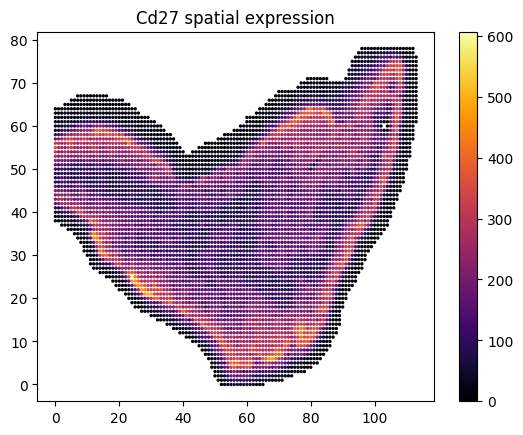

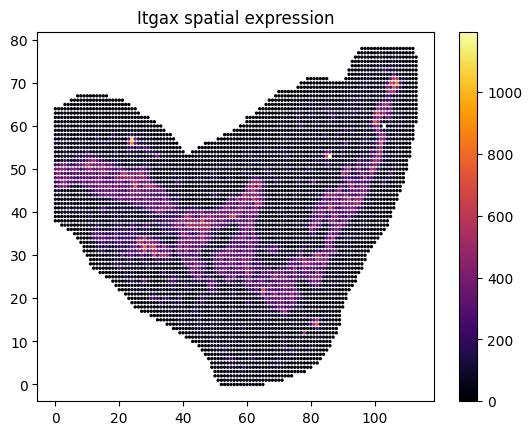

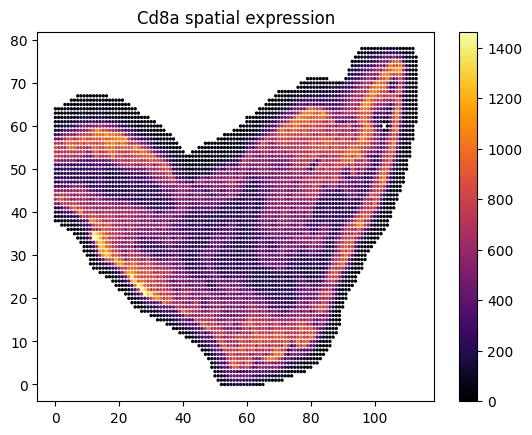

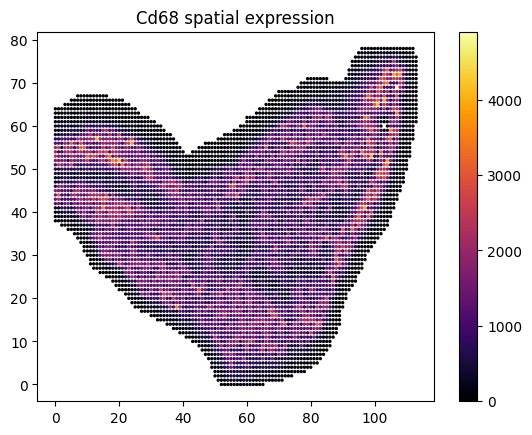

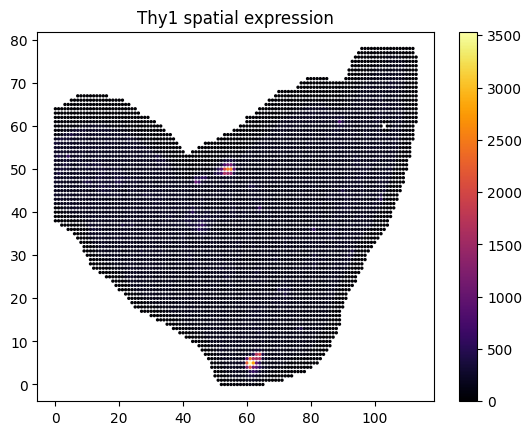

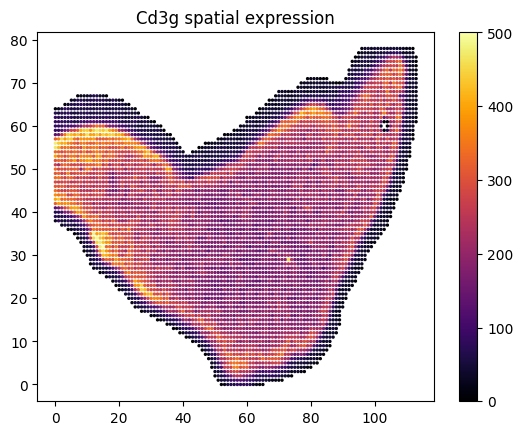

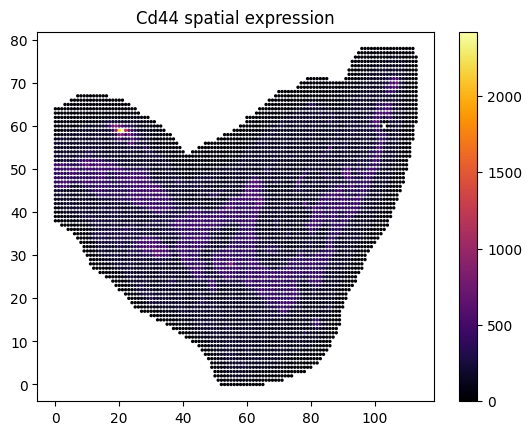

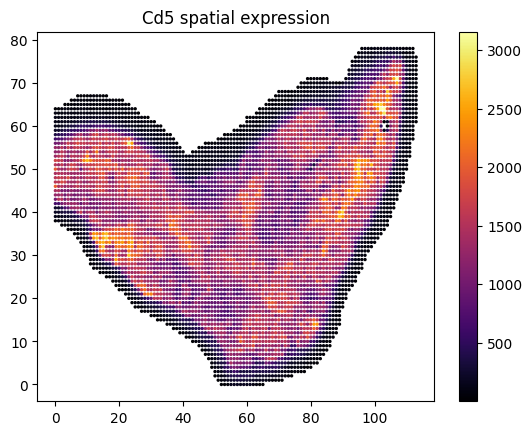

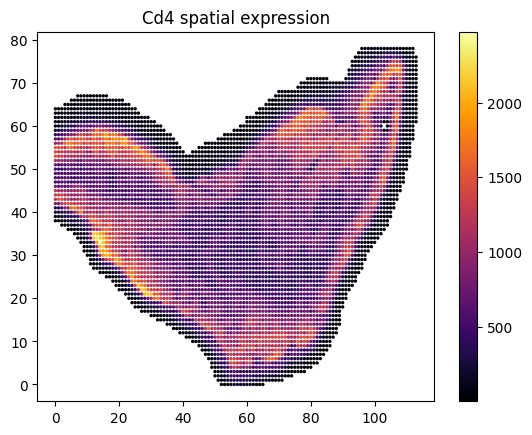

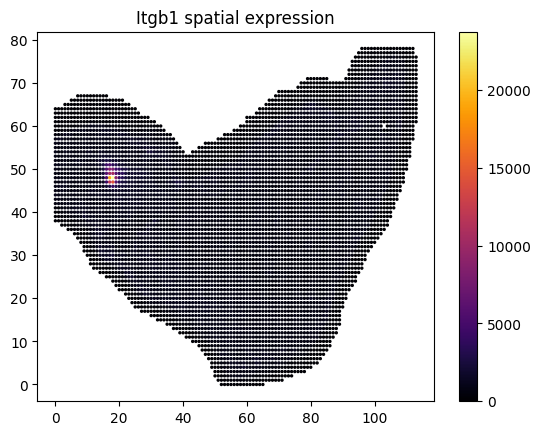

In [103]:
# for each column of the prot_data, replace the corresponding column in rna_data
for gene_name in prot_data.columns:
    csr_mtx = align_prot_rna_mtx(prot_data, gene_name)
    csr_df = csr2df(csr_mtx, gene_name)
    rna_data[gene_name] = csr_df[gene_name]

In [4]:
# save the rna_data to "prot_rep_rna_in_raw.csv"
fuzed_data_path = "/home/wuxinchao/data/st_cite_data/prot_rep_rna_in_raw.csv"
# rna_data.index.name = "coordination"
# rna_data.to_csv(fuzed_data_path, index=True)

In [17]:
rna_data = pd.read_csv(fuzed_data_path, index_col=0, header=0)
# filling the nan with 0
rna_data = rna_data.fillna(0)

Use the replaced rna expression to do the analysis

In [18]:
# create anndata through the rna_data
adata = sc.AnnData(rna_data)

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/anndata/utils.py:141: UserWarning: X converted to numpy array with dtype float64
  warnings.warn(f"{name} converted to numpy array with dtype {arr.dtype}")


In [19]:
coordination = np.asarray([coord.split("_") for coord in adata.obs.index])
coordination = np.asarray([[int(coord[0]), int(coord[1])] for coord in coordination])
adata.obsm["spatial"] = coordination

In [20]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [21]:
adata

AnnData object with n_obs × n_vars = 8605 × 25818
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'spatial'

<AxesSubplot: xlabel='n_genes_by_counts', ylabel='Count'>

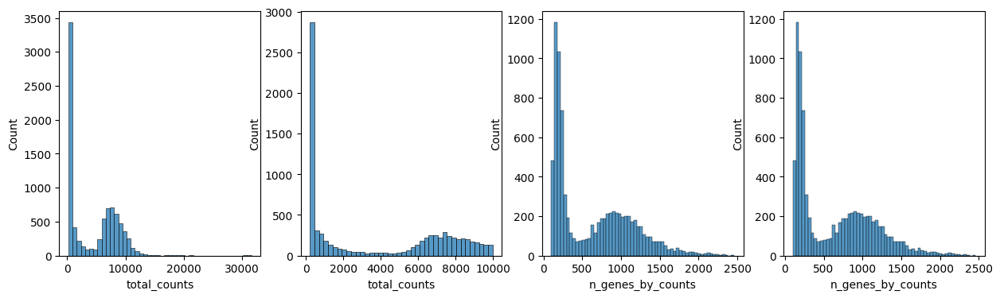

In [22]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])

In [23]:
# sc.pp.filter_cells(adata, min_counts=5000)
# sc.pp.filter_cells(adata, max_counts=20000)
sc.pp.filter_genes(adata, min_cells=10)

In [24]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
sc.pp.pca(adata, n_comps=50)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters", resolution=0.7)

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


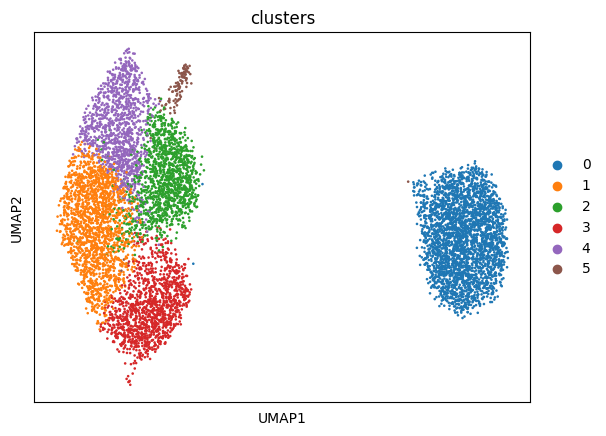

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


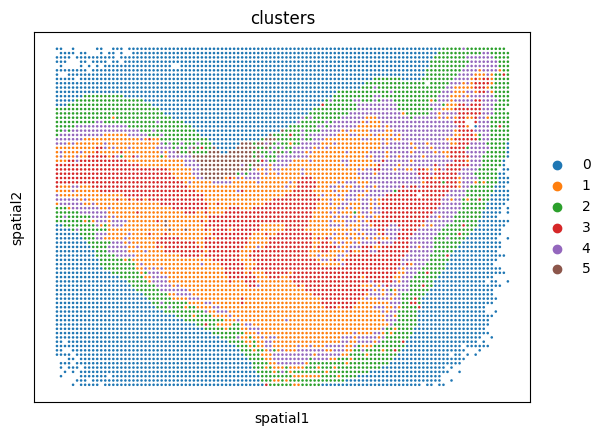

In [25]:
sc.pl.umap(adata, color="clusters")
sc.pl.embedding(adata, basis="spatial", color="clusters")

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


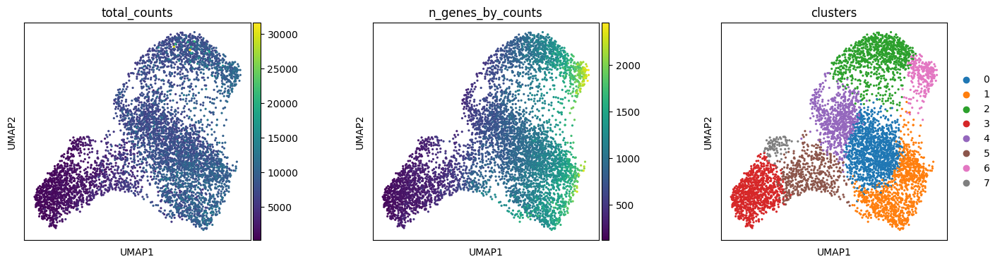

In [ ]:
plt.rcParams["figure.figsize"] = (4,4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


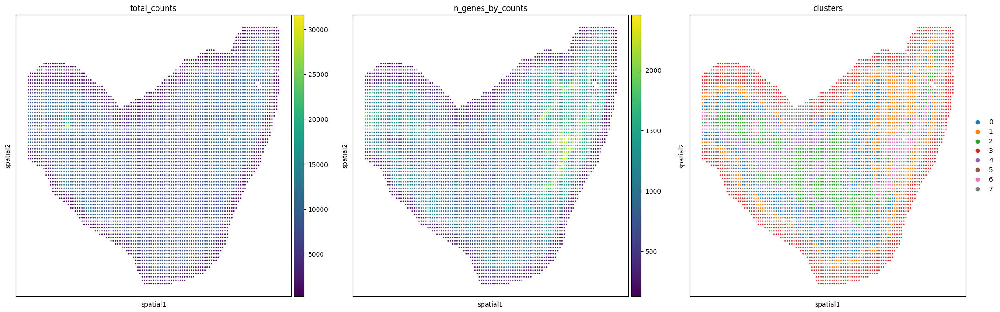

In [ ]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.embedding(adata, basis="spatial", 
                color=["total_counts", "n_genes_by_counts", "clusters"])

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


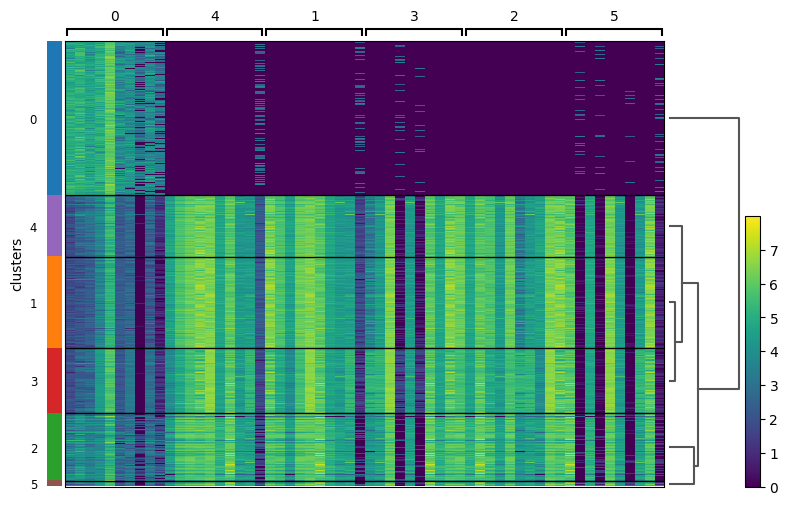

In [26]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups=[cluster for cluster in adata.obs["clusters"].unique()], n_genes=10, groupby="clusters")

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


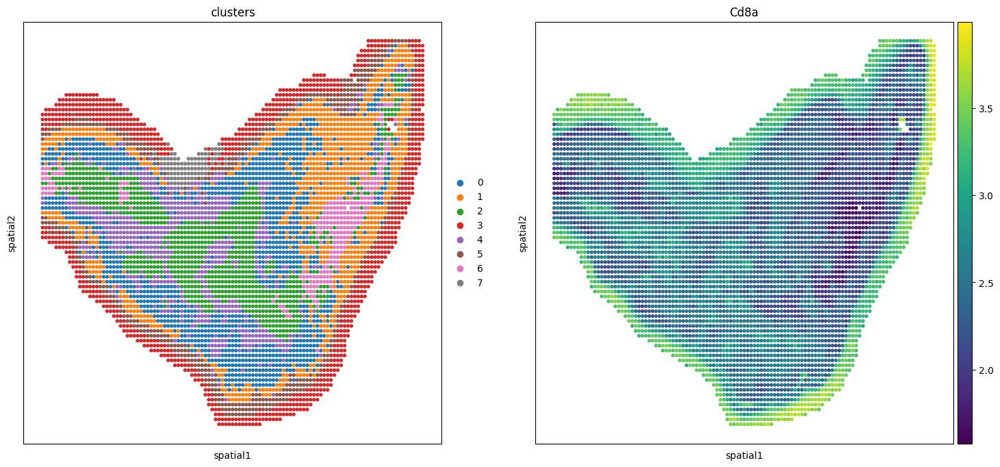

In [ ]:
sc.pl.embedding(adata, basis="spatial", color=["clusters", "Cd8a"], size=60)

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


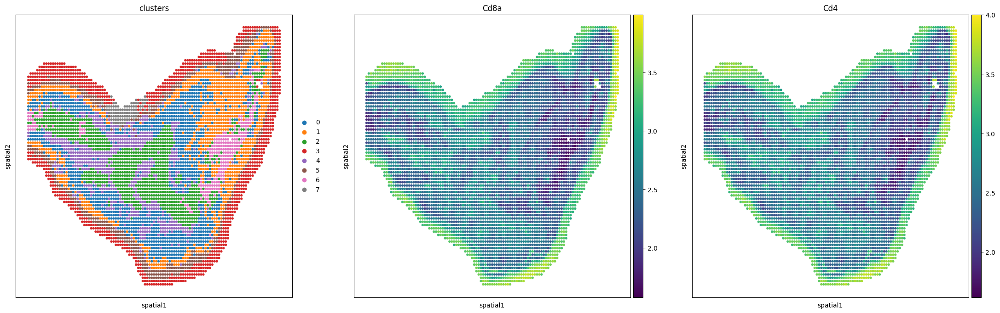

In [ ]:
sc.pl.embedding(adata, basis="spatial", color=["clusters", "Cd8a", "Cd4"], size=60)

spatial DE

In [27]:
import SpatialDE

In [28]:
%time
counts = pd.DataFrame(adata.X, columns=adata.var_names, index=adata.obs_names)
coord = pd.DataFrame(adata.obsm['spatial'], columns=["x_coord", "y_coord"], index=adata.obs_names)
results = SpatialDE.run(coord, counts)

CPU times: user 45 µs, sys: 23 µs, total: 68 µs
Wall time: 137 µs


/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/SpatialDE/base.py:26: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  R2 = -2. * np.dot(X, X.T) + (Xsq[:, None] + Xsq[None, :])
/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/SpatialDE/base.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  R2 = -2. * np.dot(X, X.T) + (Xsq[:, None] + Xsq[None, :])
Models: 100%|██████████| 10/10 [1:24:36<00:00, 507.64s/it]


In [29]:
results.index = results["g"]
adata.var = pd.concat([adata.var, results.loc[adata.var.index.values, :]], axis=1)

In [30]:
results.sort_values(["qval", "FSV", "max_mu_hat"], ascending=[True, False, False]).head(20)

,FSV,M,g,l,max_delta,max_ll,max_mu_hat,max_s2_t_hat,model,n,s2_FSV,s2_logdelta,time,BIC,max_ll_null,LLR,pval,qval
g,,,,,,,,,,,,,,,,,,
Ppp1r1a,0.999955,4,Ppp1r1a,0.500000,0.000045,15020.407028,0.001235,0.001852,SE,8605,2.363608e-05,8.304270e+03,0.002903,-30004.573660,14687.722452,332.684575,0.0,0.0
Ahsg,0.999955,4,Ahsg,0.500000,0.000045,7979.686979,0.004761,0.009522,SE,8605,2.298765e-02,8.076451e+06,0.006533,-15923.133563,7799.733005,179.953974,0.0,0.0
Gm11099,0.999955,4,Gm11099,0.500000,0.000045,10774.411801,0.002666,0.004970,SE,8605,1.618235e-04,5.685484e+04,0.003318,-21512.583207,10696.058649,78.353152,0.0,0.0
Opn3,0.999955,4,Opn3,0.500000,0.000045,11367.116544,0.002609,0.004331,SE,8605,2.295556e-03,8.065175e+05,0.002780,-22697.992692,11216.085899,151.030645,0.0,0.0
Gm11217,0.999955,4,Gm11217,0.500000,0.000045,15008.259961,0.001220,0.001857,SE,8605,5.382484e-05,1.891075e+04,0.002785,-29980.279527,14735.606607,272.653354,0.0,0.0
Atcayos,0.999815,4,Atcayos,8.163537,0.000177,14237.242391,0.236533,8.790256,SE,8605,4.442946e-10,9.403541e-03,0.005174,-28438.244388,14114.414286,122.828105,0.0,0.0
Rbm44,0.999680,4,Rbm44,8.163537,0.000307,14169.711524,0.419748,5.282490,SE,8605,3.064337e-10,2.164435e-03,0.005604,-28303.182652,13862.982519,306.729004,0.0,0.0
Mycl,0.997793,4,Mycl,8.163537,0.002119,12673.741698,0.224425,1.169837,SE,8605,1.170118e-08,1.754926e-03,0.004695,-25311.243002,12560.621252,113.120446,0.0,0.0
Mt3,0.964402,4,Mt3,0.500000,0.036909,12618.378799,0.003091,0.003117,SE,8605,2.164766e-04,1.430950e-01,0.003466,-25200.517204,12505.639078,112.739721,0.0,0.0


The result will be a `DataFrame` with P-values and other relevant values for each gene.

The most important columns are
- `g` - The name of the gene
- `pval` - The P-value for spatial differential expression
- `qval` - Significance after correcting for multiple testing
- `l` - A parameter indicating the distance scale a gene changes expression over
- `FSV` - Fraction of variance explained by spatial variation

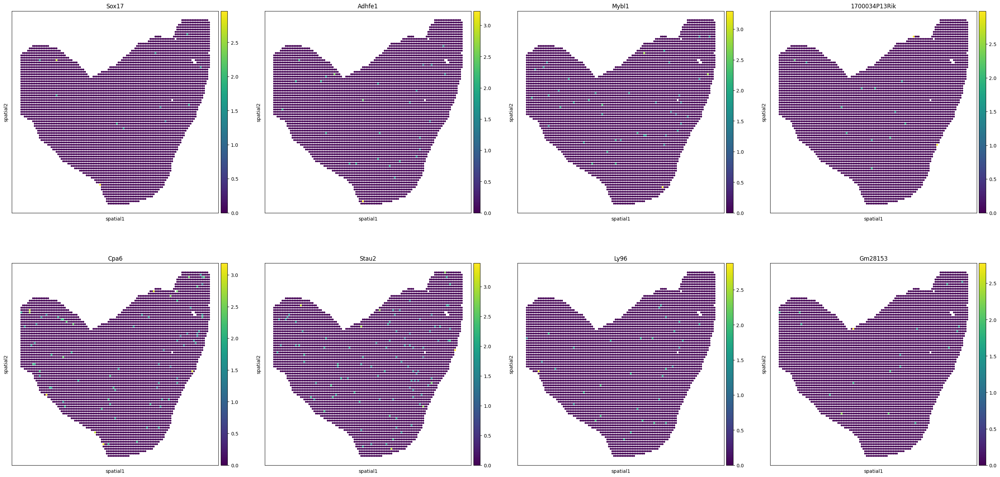

In [ ]:
sc.pl.embedding(adata, basis="spatial", color=results['g'].values[:8], size=60)

Automatic expression histology

In [31]:
import SpatialDE
import NaiveDE

In [32]:
sample_info = pd.concat([pd.DataFrame(adata.obsm['spatial'], index=adata.obs.index, columns=["x","y"]), 
                            adata.obs['total_counts']], axis=1)

In [33]:
sample_info

,x,y,total_counts
coordination,,,
37_3,37,3,238.0
23_65,23,65,427.0
78_72,78,72,372.0
94_32,94,32,4503.0
42_4,42,4,252.0
...,...,...,...
84_9,84,9,700.0
99_5,99,5,215.0
18_68,18,68,249.0


In [34]:
norm_expr = NaiveDE.stabilize(counts.T).T
resid_expr = NaiveDE.regress_out(sample_info, norm_expr.T, 'np.log(total_counts)').T

/home/wuxinchao/.conda/envs/torch/lib/python3.10/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


In [35]:
resid_expr

,Gm1992,Gm37381,Rp1,Sox17,Xkr4,Mrpl15,Lypla1,Tcea1,Rgs20,4732440D04Rik,...,Gm47283,Vamp7,Tmlhe,Csprs,AC125149.3,Gm28897,AC149090.1,CAAA01118383.1,Frmpd4,Tmsb4x
coordination,,,,,,,,,,,,,,,,,,,,,
37_3,1.220834,-0.693840,-0.680408,-0.694337,-0.675854,-0.746757,-0.778486,-0.713824,-0.699901,-0.695521,...,-0.692012,-0.717263,-0.713106,-0.692048,-0.688735,-0.708770,-0.714145,-0.699640,-2.188467,0.074699
23_65,1.047558,-0.693914,-0.679047,-0.694464,-0.674007,-0.752483,-0.787602,-0.716032,-0.700622,-0.695774,...,-0.691891,-0.719839,-0.715238,-0.691931,-0.688263,-0.710438,-0.716387,-0.700333,-2.348188,-1.954761
78_72,1.089358,-0.693897,-0.679368,-0.694434,-0.674443,-0.751133,-0.785451,-0.715511,-0.700452,-0.695715,...,-0.691919,-0.719231,-0.714735,-0.691959,-0.688375,-0.710045,-0.715858,-0.700170,-2.310509,-0.150321
94_32,0.133081,-0.694213,-0.673563,-0.694977,-0.666562,-0.775562,-0.824339,-0.724933,-0.703530,-0.696796,...,-0.691402,-0.730220,-0.723830,-0.691458,-0.686364,-0.717163,-0.725426,-0.703128,-1.883088,-1.628868
42_4,1.386993,-0.693848,-0.680274,-0.694350,-0.675673,-0.747317,-0.779378,-0.714040,-0.699972,-0.695546,...,-0.692000,-0.717515,-0.713315,-0.692037,-0.688689,-0.708933,-0.714364,-0.699708,-2.204086,0.228885
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84_9,-0.685635,-0.693977,-0.677896,-0.694572,-0.672445,-0.757326,-0.795310,-0.717900,-0.701233,-0.695989,...,-0.691788,-0.722017,-0.717041,-0.691832,-0.687865,-0.711849,-0.718284,-0.700920,-2.483256,-2.057721
99_5,-0.686989,-0.693827,-0.680644,-0.694315,-0.676175,-0.745761,-0.776901,-0.713440,-0.699776,-0.695477,...,-0.692033,-0.716815,-0.712736,-0.692069,-0.688817,-0.708479,-0.713755,-0.699519,-2.160696,-1.811838
18_68,-0.686820,-0.693846,-0.680302,-0.694347,-0.675711,-0.747200,-0.779191,-0.713994,-0.699957,-0.695540,...,-0.692003,-0.717462,-0.713271,-0.692039,-0.688698,-0.708899,-0.714318,-0.699693,-2.200813,-1.842419


In [36]:
sign_results = results.query('qval<0.05')

In [37]:
print(sign_results['l'].value_counts())
print(sign_results['l'].mean())

16.409882    1741
8.163537     1002
0.500000      302
4.061171      199
32.986220     107
2.020339       19
1.005072       14
Name: l, dtype: int64
12.201721329631939


In [39]:
histology_results, patterns = SpatialDE.aeh.spatial_patterns(
    adata.X, resid_expr, sign_results, C=5, l=10.5, verbosity=1, maxiter=10)

iter 0, ELBO: -1.55e+05
iter 1, ELBO: -5.14e+07, delta_ELBO: 5.12e+07


KeyboardInterrupt: 

In [ ]:
histology_results.head()

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(10,20))
for i, ax in enumerate(axs.flat):
    ax[i].scatter(sample_info["x"], sample_info["y"], c=patterns[i])
    ax[i].axis('equal')
    ax[i].title(f"Pattern {i} - {histology_results.query("pattern == @i").shape}")
    ax[i].colorbar(ticks=[])

In [ ]:
for i in histology_results.sort_values('pattern').pattern.unique():
    print(f"Pattern {i}")
    print(f", {histology_results.query("pattern == @i").sort_values("membership")['g'].tolist()}")

Interactive namespace is empty.


In [40]:
h5ad_filepath = "/home/wuxinchao/data/project/spatial-CITE-seq/mid_result/B01825A4_rna_prot_raw_rep.h5ad"
adata.write_h5ad(h5ad_filepath)

... storing 'model' as categorical


In [ ]:
# not used
# Test the indices of csr_matrix
# Get the row and col index of the csr_mtx data
data_lst = []
for i in range(csr_mtx.indptr.shape[0]-1):
    row_ind = i
    row_data_lst = []
    col_ind = csr_mtx.indices[csr_mtx.indptr[i]:csr_mtx.indptr[i+1]]
    data = csr_mtx.data[csr_mtx.indptr[i]:csr_mtx.indptr[i+1]]
    for j in range(col_ind.shape[0]):
        row_data_lst.append((row_ind, col_ind[j], data[j]))
    data_lst.append(row_data_lst)
print(data_lst[0])
print(csr_mtx)